In [1]:
from data_flywheel.flywheel import DataFlywheel

/root/miniforge-pypy3/envs/data_flywheel/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


In [2]:
# Create a configuration dictionary

config = {
    'annotation_parquet': '../test.parquet',
    'image_path': '/workspace/yolo_v8_training/oiv7_full/test/',
    'log_wandb': True,
    'object_class_name': 'car (automobile)',
    'voc_annotations_folder': 'pascal_voc_annotations_car/',
    'wandb_project': 'data-flywheel-testset-car',
    'image_size': 480
}

# Instantiate the DataFlywheel
flywheel = DataFlywheel(config)


04/11/2024 08:40:43 - ERROR - wandb.jupyter -   Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: dnth. Use `wandb login --relogin` to force relogin


INFO     - Loading image annotations... | data_flywheel.flywheel:load_annotations:37


Converting to VOC:   0%|          | 0/1552 [00:00<?, ? imgs/s]

INFO     -   VOC Annotations folder: pascal_voc_annotations_car/ | data_flywheel.flywheel:load_annotations:80
INFO     -   Image folder: /workspace/yolo_v8_training/oiv7_full/test/ | data_flywheel.flywheel:load_annotations:81
wandb: Adding directory to artifact (./pascal_voc_annotations_car)... Done. 1.1s


  0%|          | 0/1552 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/1552 [00:00<?, ?it/s]

INFO     -   Train on 1241 images | data_flywheel.flywheel:load_annotations:114
INFO     -   Validate on 311 images | data_flywheel.flywheel:load_annotations:115


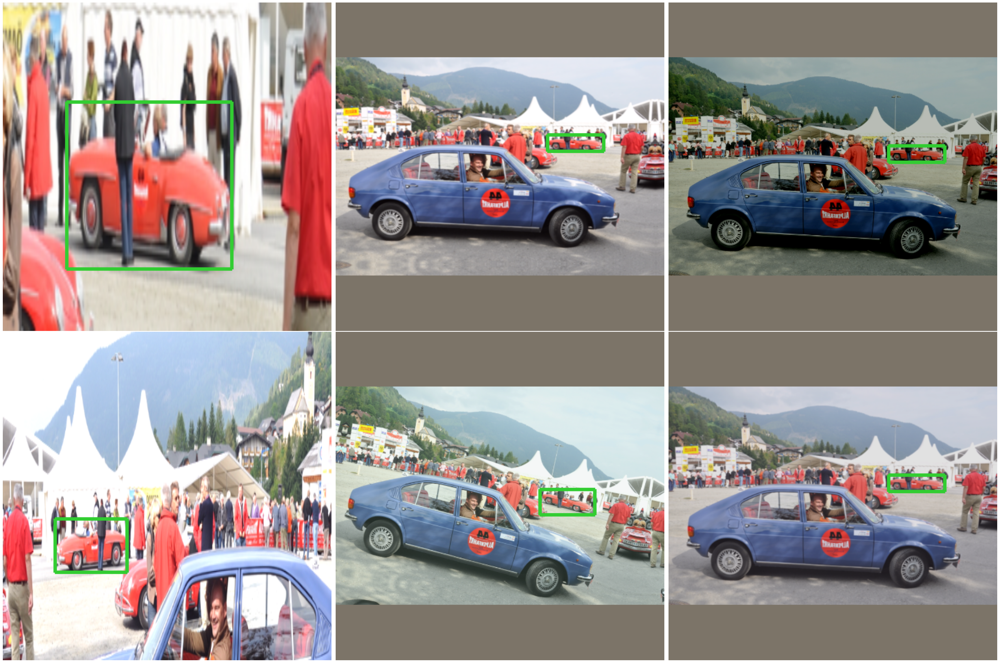

In [3]:
%matplotlib inline
flywheel.load_annotations(show=True)

INFO     - Loading model... | data_flywheel.flywheel:load_model:199
2024-04-11 08:41:21,642 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-04-11 08:41:21,644 - mmcv - INFO - load model from: torchvision://resnet50
2024-04-11 08:41:21,645 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2024-04-11 08:41:21,728 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-04-11 08:41:21,740 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-04-11 08:41:21,769 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls', 'std': 0.01, 'bias_prob': 0.01}}
2024-04-11 08:41:21,807 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load fr

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([1, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([1]).


/root/miniforge-pypy3/envs/data_flywheel/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


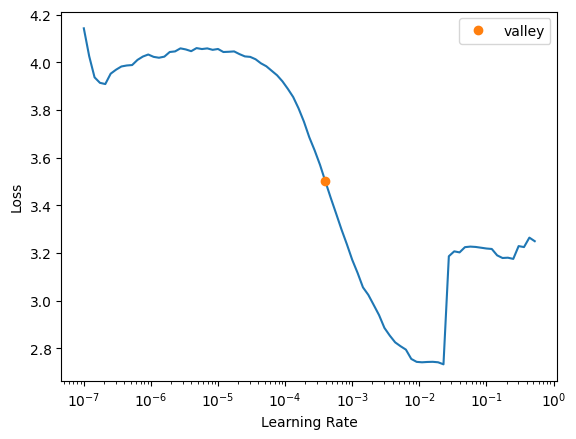

In [4]:
flywheel.load_model()

INFO     - Training model... | data_flywheel.flywheel:train_model:230


Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'


epoch,train_loss,valid_loss,COCOMetric,time
0,1.623830,1.045749,0.698857,00:30


Better model found at epoch 0 with valid_loss value: 1.0457487106323242.


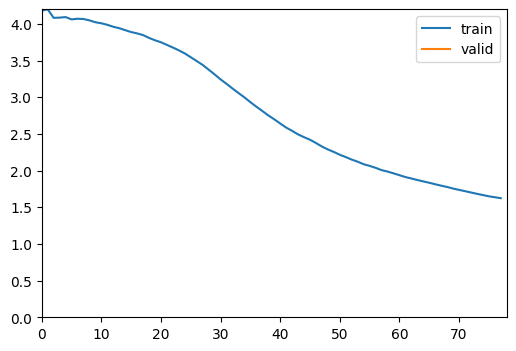

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.971083,0.807947,0.824014,00:31


Better model found at epoch 0 with valid_loss value: 0.807946503162384.


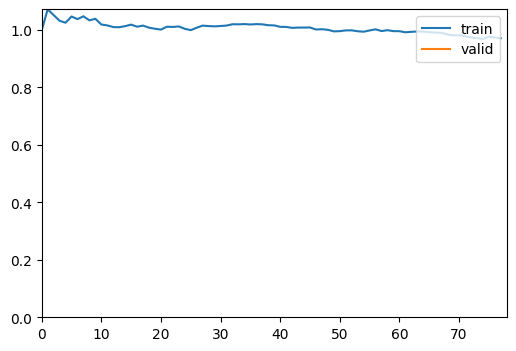

In [5]:
flywheel.train_model(lr=3e-4, epoch=1, freeze_epoch=1)

INFO     - Identifying most incorrect examples... | data_flywheel.flywheel:get_most_wrong:245
INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:220


  0%|          | 0/311 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

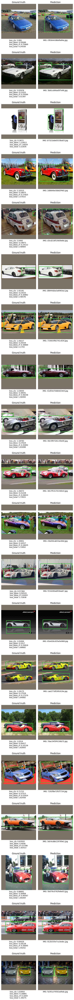

In [6]:
annotations_to_review = flywheel.get_most_wrong(method='top-loss')

In [ ]:
len(flywheel.annotations_to_review)

In [ ]:
flywheel.relabel_data(relabel_filename='relabel_list.txt')

In [7]:
## Export to fastdup format

flywheel.export_annotations('export.parquet')

wandb: Adding directory to artifact (./pascal_voc_annotations_car)... Done. 1.1s


COCOMetric,▁█
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_2,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_3,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_4,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_5,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_6,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▂▂▂▃▃▄▄▅▅▆▆▇▇▇███▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▁▁▁▂▂▂▃▃▄▄▅▅▆▆▇▇▇███▁▁▁▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
